In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib as mpl
import matplotlib.pyplot as plt
from colorspacious import cspace_converter
from matplotlib.pyplot import rc_context
from matplotlib import colormaps
import scipy
import scipy.stats as stats
import matplotlib.ticker as ticker
import json
from openpyxl import Workbook
import seaborn as sns
from adjustText import adjust_text
import re

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

/home/ubuntu/anaconda3/envs/scanpyenv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.10.1 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.5 pynndescent==0.5.12


In [3]:
adata_uninfected_subset = sc.read_h5ad('/vol/ExtraVol/DataHistory/Parasite_Clustered_UninfectedSubset.h5ad')
adata = sc.read_h5ad('/vol/ExtraVol/DataHistory/Parasite_Clustered.h5ad')

/home/ubuntu/anaconda3/envs/scanpyenv/lib/python3.12/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [4]:
# Load the marker genes dictionary from the JSON file
with open('/vol/ExtraVol/ParasiteDEX/marker_genes_dict.json', 'r') as f:
    marker_genes_dict = json.load(f)

In [5]:
genelist =['Pdpn', 'Pdgfra', 'Igfbp3', 'Fgfr2', 'Pdgfrb', 'Des', 'Acta2', 'Myh11', 'Actg2', 'Cd81', 'Ackr4', 'Cd55', 'Cd34', 'Jam2', 'Ccl11', 'Kit', 'Hand1']

In [9]:
adata.obs["identity"]

0        PdgfraloCd55+ FB
1                Cd81+ FB
2                Cd81+ FB
3        PdgfraloCd55+ FB
4                Cd81+ FB
               ...       
38024         Pdgfralo FB
38025    PdgfraloCd55+ FB
38026    PdgfraloCd55+ FB
38027    PdgfraloCd55+ FB
38028    PdgfraloCd55+ FB
Name: identity, Length: 38029, dtype: category
Categories (10, object): ['Ccl11+ MF', 'Ccl11- MF', 'Cd81+ FB', 'Hand1+', ..., 'PdgfrahiJam2+ FB', 'Pdgfralo FB', 'PdgfraloCd55+ FB', 'Pericytes']

In [6]:
# Read the second sheet of the Excel file
df = pd.read_excel("/vol/ExtraVol/ParasiteDEX/DEX_results_parasite_infection_pseudobulked_MSP.xlsx", sheet_name=1)

# Extract the values from the "name" column and convert them to a list of strings
genelist_infection = df["name"].astype(str).tolist()

In [42]:
# Read the Excel file
excel_file = "/vol/ExtraVol/ParasiteDEX/ParasiteDEX_IdentitySpecificInfection.xlsx"

# Initialize an empty dictionary to store the results
genedict_infection = {}

# Iterate over each sheet in the Excel file
for sheet_name in pd.read_excel(excel_file, sheet_name=None, engine='openpyxl').keys():
    # Read the current sheet into a DataFrame
    df = pd.read_excel(excel_file, sheet_name=sheet_name, engine='openpyxl')
    
    # Filter out rows where "name" starts with "Rpl" or "Rps"
    filtered_df = df[~df["Symbol"].str.contains("^Rpl|^Rps|^CYT|^COX|^ATP")]
    
    # Get the top 10 values from the "name" column after filtering
    top_10_genes = filtered_df["Symbol"].head(10).tolist()
    
    # Add the top 10 genes to the dictionary with the sheet name as the key
    genedict_infection[sheet_name] = top_10_genes

# Print the resulting dictionary
print(genedict_infection)

{'Ccl11negMF': ['Myl6', 'Gas1', 'Hmgn1', 'Tuba1a', 'Uba52', 'Acta2', 'Ppia', 'Tagln', 'Dstn', 'Eef1a1'], 'Ccl11posMF': ['Adamdec1', 'Acta2', 'Fmo2', 'Tpm1', 'Actg2', 'Dcn', 'Myh11', 'Il33', 'Tpm2', 'Gsn'], 'Cd81posFB': ['Col3a1', 'Col1a1', 'Dcn', 'Sparc', 'Gsn', 'Col1a2', 'Fos', 'Nfkb1', 'Hspa1b', 'Mgp'], 'Hand1pos': ['Chrdl1', 'Col4a5', 'Sctr', 'Tmem176b', 'Gem', 'Arhgap42', 'Sfrp1', 'Lrrtm3', 'Hipk2', 'Cadm1'], 'PdgfrahiCd55posFB': ['Postn', 'Ccl11', 'Tnc', 'Col3a1', 'Hspa1b', 'Tff2', 'Col6a2', 'Sdk1', 'Dcn', 'Mmp10'], 'PdgfrahiFB': ['Acta2', 'Nrg1', 'Sox6', 'Fosb', 'Fos', 'Jun', 'Dnah12', 'Dcn', 'Actb', 'Tff2'], 'PdgfrahiJam2posFB': ['Tagln', 'Acta2', 'Ccl2', 'Aldh1a3', 'ND2', 'Tnc', 'Col1a1', 'Fth1', 'Tff2', 'Mgp'], 'PdgfraloCd55posFB': ['Gsn', 'Hspa1b', 'Col3a1', 'Dcn', 'Ccl11', 'Tnc', 'Hspa1a', 'Serpina3n', 'Nfkb1', 'Col1a1'], 'PdgfraloFB': ['Ccl11', 'C7', 'Cxcl2', 'Serpina3n', 'Igfbp3', 'Hspa1b', 'Nrg1', 'Cxcl10', 'Col6a2', 'Fosb'], 'Pericytes': ['Ubb', 'Ccl11', 'Adamts9', 'Lmna

In [43]:
# Function to sanitize the identity strings
def sanitize_identity(identity):
    # Remove spaces
    identity = identity.replace(" ", "")
    
    # Replace "+" with "pos" and "-" with "neg"
    identity = identity.replace("+", "pos").replace("-", "neg")
    
    return identity

# Apply the sanitize_identity function to create the new column
adata.obs["identity_simplified"] = adata.obs["identity"].apply(sanitize_identity)

# Print the new column to verify the changes
print(adata.obs["identity_simplified"])

0        PdgfraloCd55posFB
1                Cd81posFB
2                Cd81posFB
3        PdgfraloCd55posFB
4                Cd81posFB
               ...        
38024           PdgfraloFB
38025    PdgfraloCd55posFB
38026    PdgfraloCd55posFB
38027    PdgfraloCd55posFB
38028    PdgfraloCd55posFB
Name: identity_simplified, Length: 38029, dtype: category
Categories (10, object): ['Ccl11posMF', 'Ccl11negMF', 'Cd81posFB', 'Hand1pos', ..., 'PdgfrahiJam2posFB', 'PdgfraloFB', 'PdgfraloCd55posFB', 'Pericytes']


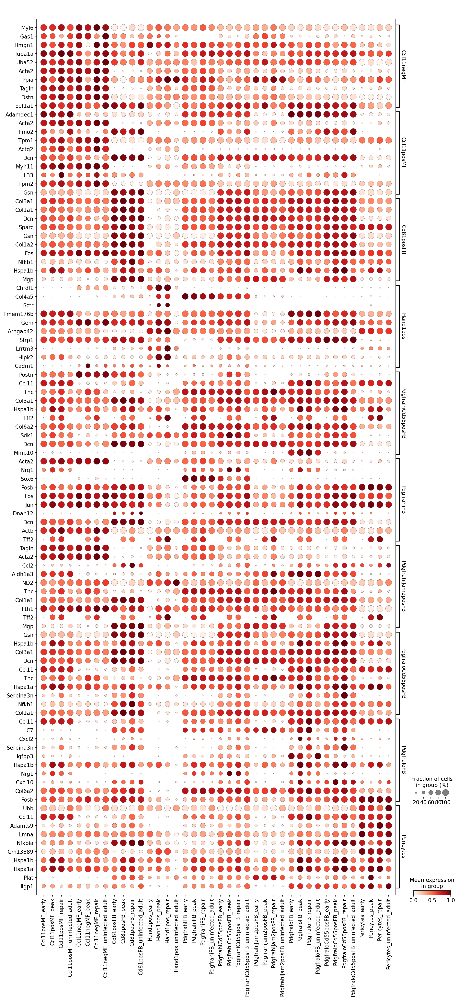

In [48]:
# Create the dotplot with clustered rows and ordered columns
ax = sc.pl.dotplot(
    adata,
    genedict_infection,
    groupby=["identity_simplified", "stage_grouped"],
    dendrogram=False,
    dot_max=1,
    dot_min=0,
    standard_scale='var',
    return_fig=True,
    swap_axes=True
)

ax.savefig('/vol/ExtraVol/ParasiteDEX/infection_genes_CellTypeSpecific_dotplot.pdf')

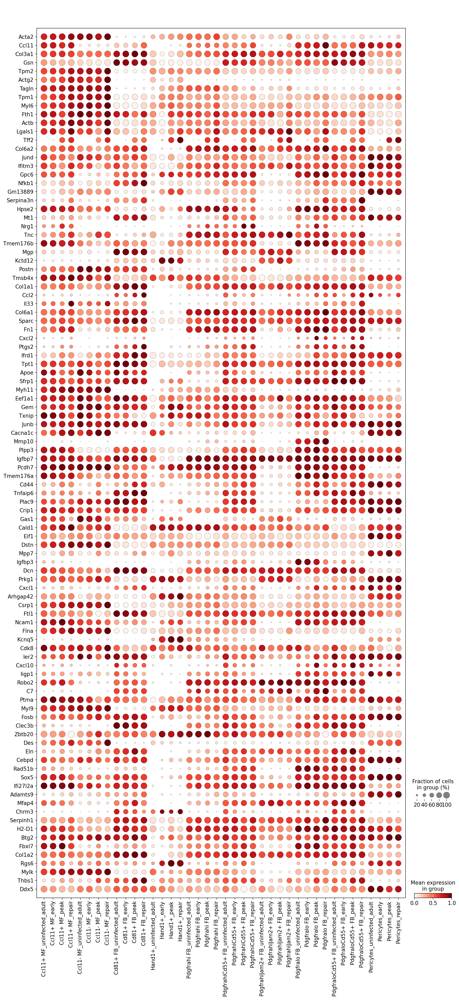

In [34]:
# Define the desired order of the "stage_grouped" categories
stage_order = ["uninfected_adult", "early", "peak", "repair"]

# Create a new column in adata.obs that combines "identity" and "stage_grouped"
adata.obs["identity_stage"] = adata.obs["identity"].astype(str) + "_" + adata.obs["stage_grouped"].astype(str)

# Convert the "identity_stage" column to categorical dtype
adata.obs["identity_stage"] = adata.obs["identity_stage"].astype("category")

# Get the unique identities
identities = adata.obs["identity"].cat.categories

# Create the ordered list of categories for "identity_stage"
ordered_categories = [f"{identity}_{stage}" for identity in identities for stage in stage_order]

# Set the category order for the "identity_stage" column
adata.obs["identity_stage"] = adata.obs["identity_stage"].cat.set_categories(ordered_categories, ordered=True)

# Create the dotplot with clustered rows and ordered columns
ax = sc.pl.dotplot(
    adata,
    genelist_infection,
    groupby="identity_stage",
    dendrogram=False,
    dot_max=1,
    dot_min=0,
    standard_scale='var',
    return_fig=True,
    swap_axes=True
)

# Save the plot as a PDF
ax.savefig('/vol/ExtraVol/ParasiteDEX/infection_genes_dotplot.pdf')

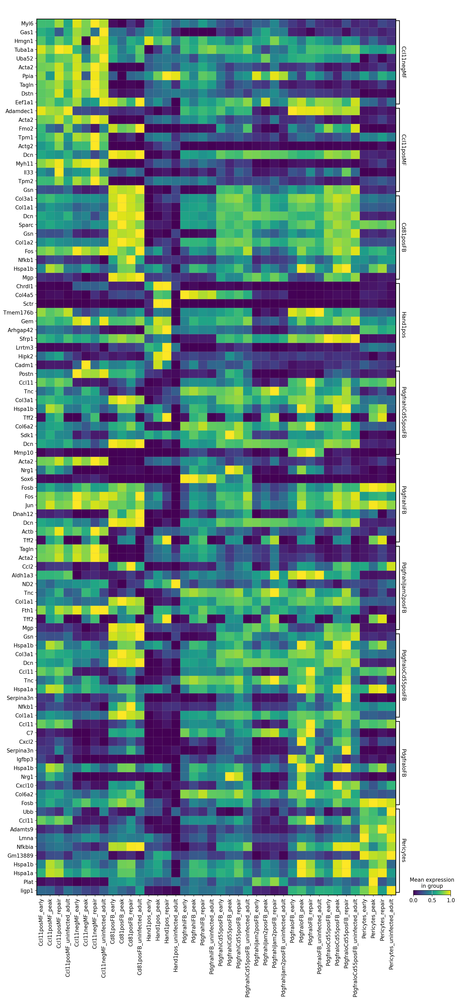

In [51]:
sc.pl.matrixplot(
    adata,
    genedict_infection,
    groupby=["identity_simplified", "stage_grouped"],
    swap_axes=True,
    standard_scale='var'
)

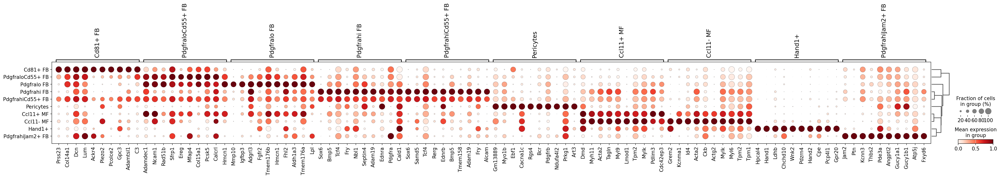

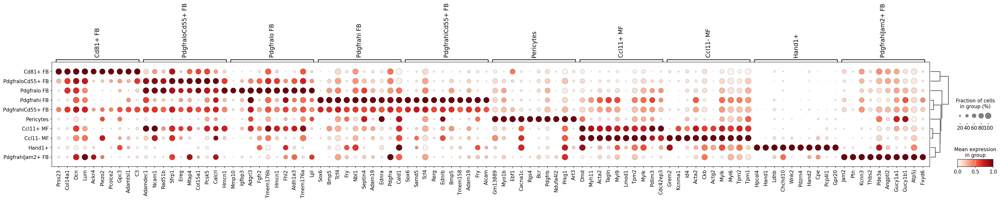

In [12]:
ax = sc.pl.dotplot(adata_uninfected_subset, marker_genes_dict, groupby='identity', dendrogram=True, dot_max=1, dot_min=0, standard_scale='var', return_fig=True, use_raw=False)
# Save the plot as a PDF
ax.savefig('/vol/ExtraVol/ParasiteDEX/marker_genes_dotplot.pdf')

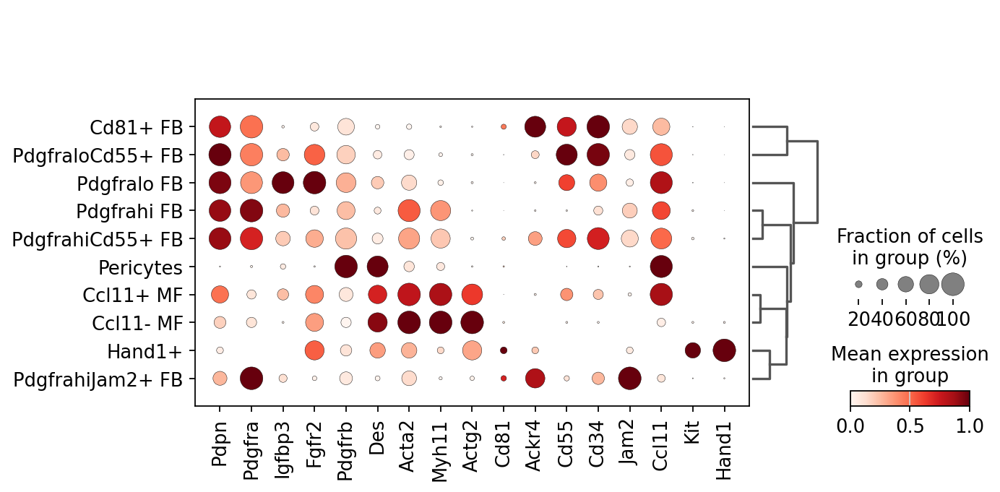

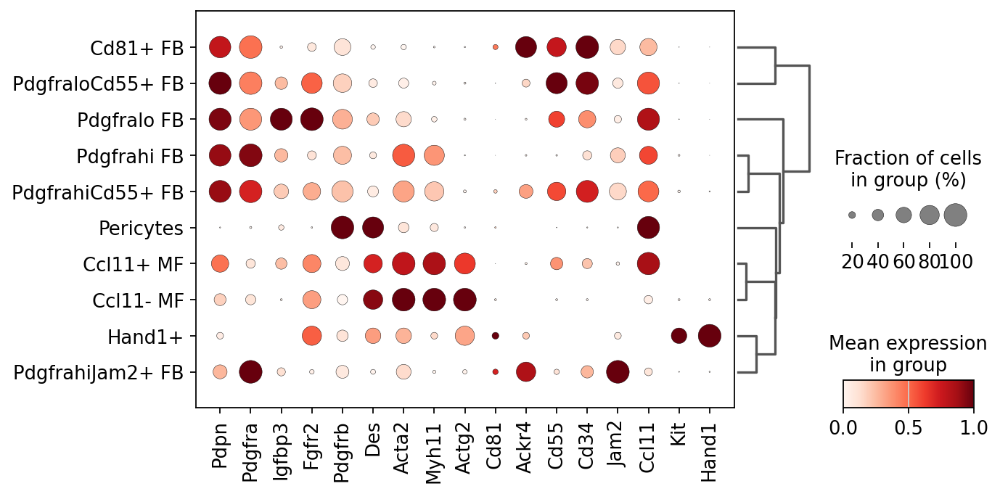

In [7]:
ax = sc.pl.dotplot(adata_uninfected_subset, genelist, groupby='identity', dendrogram=True, dot_max=1, dot_min=0, standard_scale='var', return_fig=True, use_raw=False)
# Save the plot as a PDF
ax.savefig('/vol/ExtraVol/ParasiteDEX/genelist_dotplot.pdf')

In [38]:
marker_genes_dict

{'PdgfraloCd55+ FB': ['Adamdec1',
  'Ncam1',
  'Rad51b',
  'Sfrp1',
  'Ereg',
  'Mfap4',
  'Col15a1',
  'Pcsk5',
  'Calcrl',
  'Hmcn1'],
 'Cd81+ FB': ['Prss23',
  'Col14a1',
  'Dcn',
  'Lum',
  'Ackr4',
  'Piezo2',
  'Pcolce2',
  'Gpc3',
  'Adamtsl1',
  'C3'],
 'Pdgfrahi FB': ['Sox6',
  'Bmp5',
  'Tcf4',
  'Fry',
  'Nbl1',
  'Septin4',
  'Adam19',
  'Ednra',
  'Pdgfra',
  'Cald1'],
 'Pdgfralo FB': ['Mmp10',
  'Igfbp3',
  'Adgrl3',
  'Fgfr2',
  'Tmem176b',
  'Hmcn1',
  'Fhl2',
  'Aldh1a3',
  'Tmem176a',
  'Lpl'],
 'Ccl11+ MF': ['Dmd',
  'Myh11',
  'Acta2',
  'Tagln',
  'Myl9',
  'Lmod1',
  'Tpm2',
  'Mylk',
  'Pdlim3',
  'Cdc42ep3'],
 'Ccl11- MF': ['Grem2',
  'Kcnma1',
  'Id4',
  'Acta2',
  'Ckb',
  'Actg2',
  'Mylk',
  'Myl6',
  'Tpm2',
  'Tpm1'],
 'Pericytes': ['Gm13889',
  'Myo1b',
  'Ebf1',
  'Cacna1c',
  'Rgs4',
  'Bcr',
  'Pdgfrb',
  'Ndufa4l2',
  'Prkg1',
  'Art3'],
 'PdgfrahiCd55+ FB': ['Sox6',
  'Samd5',
  'Tcf4',
  'Rerg',
  'Ednrb',
  'Bmp5',
  'Tmem158',
  'Adam19',
  'Fry',

    using 'X_pca' with n_pcs = 30
Storing dendrogram info using `.uns['dendrogram_identity']`


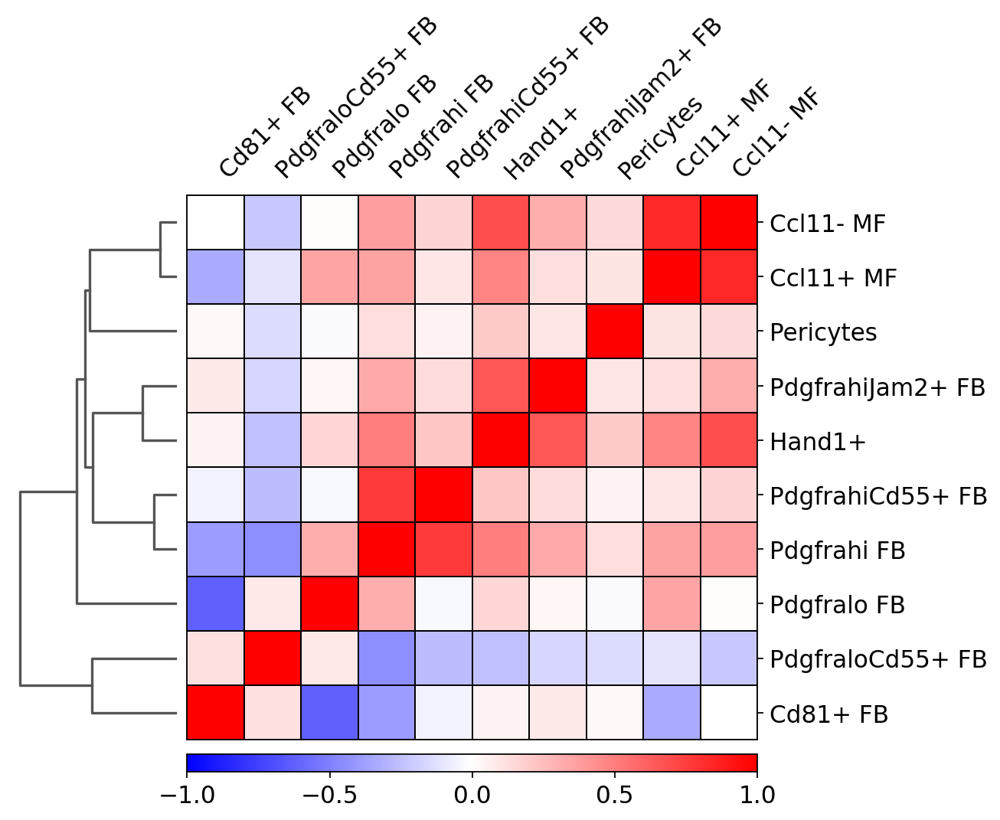

<Figure size 320x320 with 0 Axes>

In [8]:
sc.tl.dendrogram(adata_uninfected_subset, 'identity', n_pcs=30)

# Temporarily set rcParams to remove gridlines
with plt.rc_context({'axes.grid': False}):
    sc.pl.correlation_matrix(adata_uninfected_subset, 'identity')
    # Save the plot as a PDF
    plt.savefig('/vol/ExtraVol/ParasiteDEX/correlation_matrix.pdf')
    # Show the plot (optional)
    plt.show()

In [9]:
adata = sc.read_h5ad('/vol/ExtraVol/DataHistory/Parasite_Clustered.h5ad')

/home/ubuntu/anaconda3/envs/scanpyenv/lib/python3.12/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


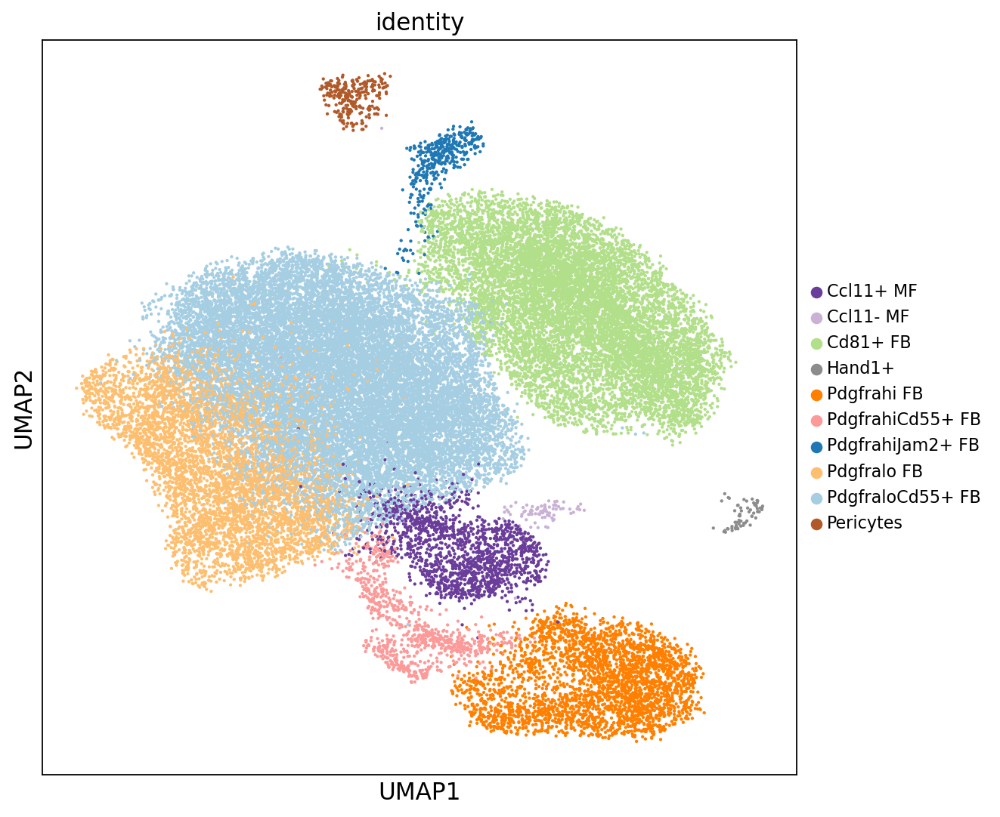

In [10]:
colors_hex = {
    "PdgfraloCd55+ FB": "#a6cee3",
    "Cd81+ FB": "#b2df8a",
    "Pdgfralo FB": "#fdbf6f",
    "Pdgfrahi FB": "#ff7f00",
    "Ccl11+ MF": "#6a3d9a",
    "PdgfrahiCd55+ FB": "#fb9a99",
    "PdgfrahiJam2+ FB": "#1f78b4",
    "Pericytes": "#b15928",
    "Ccl11- MF": "#CAB2D6",
    "Hand1+": "#8c8c8c"
}
sc.tl.umap(adata, init_pos='paga', min_dist=0.5, spread=0.5)
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color = "identity", use_raw=False, legend_fontsize = 10, na_in_legend = False, size=15, palette = colors_hex)

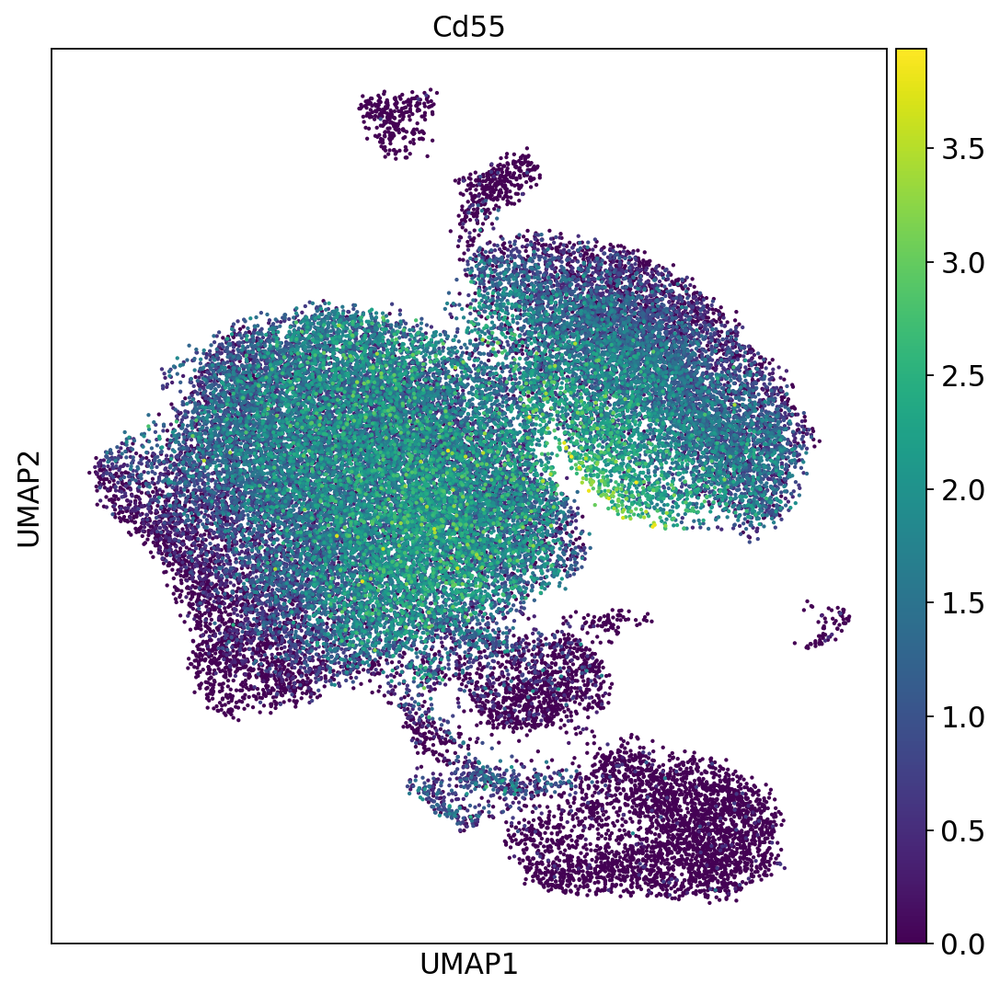

In [70]:
with rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color = "Cd55", use_raw=False, legend_fontsize = 10, na_in_legend = False, size=15)

In [69]:
# Define the pairs for comparison
pairs = [
    ('PdgfrahiCd55+ FB', 'Pdgfrahi FB'),
    ('PdgfrahiJam2+ FB', 'Pdgfrahi FB'),
    ('PdgfraloCd55+ FB', 'Pdgfralo FB'),
    ('Ccl11+ MF', 'Ccl11- MF')
]

# Create a new workbook
wb = Workbook()
wb.remove(wb.active)  # Remove the default sheet

# Loop over each pair
for group, reference in pairs:
    # Run differential expression analysis
    sc.tl.rank_genes_groups(adata_uninfected_subset, 'identity', method='wilcoxon', 
                            use_raw=False, groups=[group], reference=reference)
    
    # Extract the results into a DataFrame
    df = sc.get.rank_genes_groups_df(adata_uninfected_subset, group=group)
    
    # Calculate signed -log10 adjusted p-value
    df['signedlogpadj'] = np.sign(df['logfoldchanges']) * -np.log10(df['pvals_adj'] + 1e-300)  # Adding a small constant to avoid log(0)
    
    # Sort by the signed -log10 adjusted p-value
    df = df.sort_values('signedlogpadj', ascending=False).reset_index(drop=True)
    
    # Add a rank column
    df['rank'] = df.index
    
    # Create a sheet name without "FB" and "MF"
    sheet_name = group.replace(' FB', '').replace(' MF', '').replace(' ', '') + 'vs' + reference.replace(' FB', '').replace(' MF', '').replace(' ', '')
    
    # Add the DataFrame to a new sheet in the workbook
    ws = wb.create_sheet(title=sheet_name)
    
    # Write the DataFrame to the sheet
    for r_idx, row in enumerate(df.itertuples(), 1):
        for c_idx, value in enumerate(row[1:], 1):  # skip the index in row
            ws.cell(row=r_idx, column=c_idx, value=value)
    
    # Add header
    for col_idx, col_name in enumerate(df.columns, 1):
        ws.cell(row=1, column=col_idx, value=col_name)

# Save the workbook
wb.save('/vol/ExtraVol/ParasiteDEX/ParasiteDEX_SelectedPairs_Results.xlsx')

# Confirm completion
print("Data frames have been exported to Excel workbook successfully.")


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be i

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


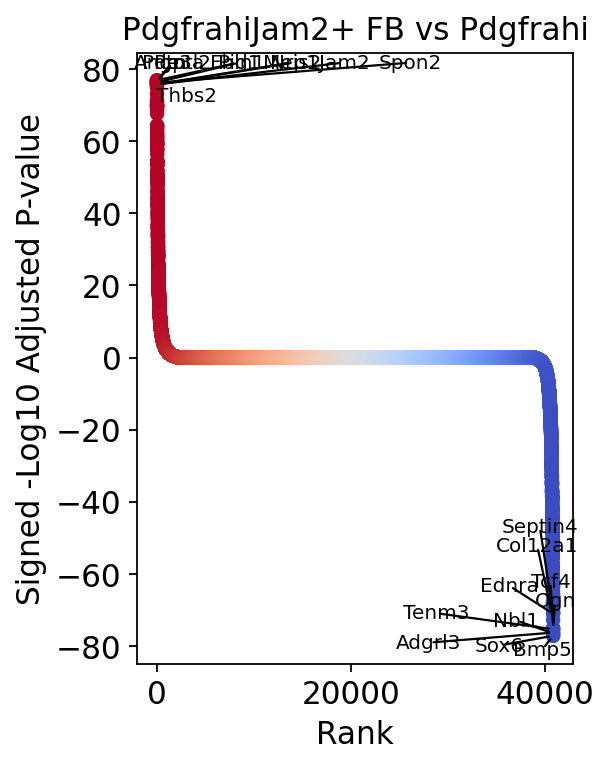

In [67]:
# Run differential expression analysis
sc.tl.rank_genes_groups(adata_uninfected_subset, 'identity', method='wilcoxon', 
                        use_raw=False, groups=['PdgfrahiJam2+ FB'], reference='Pdgfrahi FB')

# Extract the results into a DataFrame
df = sc.get.rank_genes_groups_df(adata_uninfected_subset, group='PdgfrahiJam2+ FB')

# Calculate signed -log10 adjusted p-value
df['signed -log10(padj)'] = np.sign(df['logfoldchanges']) * -np.log10(df['pvals_adj'] + 1e-300)  # Adding a small constant to avoid log(0)

# Sort by the signed -log10 adjusted p-value
df = df.sort_values('signed -log10(padj)', ascending=False).reset_index(drop=True)

# Add a rank column
df['rank'] = df.index + 1

# Create the waterfall plot
plt.figure(figsize=(4, 5))
sns.scatterplot(data=df, x='rank', y='signed -log10(padj)', hue='rank', 
                palette=sns.color_palette("coolwarm_r", as_cmap=True), edgecolor=None, legend=False)

# Add titles and labels
plt.title('PdgfrahiJam2+ FB vs Pdgfrahi')
plt.xlabel('Rank')
plt.ylabel('Signed -Log10 Adjusted P-value')

# Remove grid lines
plt.grid(False)

# Create annotations for the top 10 genes from both ends
annotations = []
for i in list(df.head(10).index):
    annotations.append(plt.text(df.loc[i, 'rank'], df.loc[i, 'signed -log10(padj)'],
                                df.loc[i, 'names'], fontsize=9, ha='right', color='black'))
for i in list(df.tail(10).index):
    annotations.append(plt.text(df.loc[i, 'rank'], df.loc[i, 'signed -log10(padj)'],
                                df.loc[i, 'names'], fontsize=9, ha='left', color='black'))

# Adjust text to avoid overlap
adjust_text(annotations, arrowprops=dict(arrowstyle='-', color='black'), force_text=0.2, expand_text=(1, 1))

# Customize the layout
plt.tight_layout()

# Save the plot as a PDF
plt.savefig('/vol/ExtraVol/ParasiteDEX/waterfall_plot_Pdgfrahi_vs_PdgfrahiCd55pos.pdf')

# Show the plot
plt.show()


In [41]:
df

,names,scores,logfoldchanges,pvals,pvals_adj,signed -log10(padj),rank
0,Sox6,19.214134,14.079440,2.818945e-82,6.078477e-78,77.216205,1
1,Bmp5,19.211357,7.933506,2.973887e-82,6.078477e-78,77.216205,2
2,Nbl1,19.077839,5.814013,3.858874e-81,2.858032e-77,76.543933,3
3,Adgrl3,19.025661,6.059544,1.045592e-80,4.749193e-77,76.323380,4
4,Ogn,18.889565,5.190616,1.389882e-79,4.052860e-76,75.392238,5
...,...,...,...,...,...,...,...
40874,Pid1,-19.033598,-5.050219,8.986645e-81,4.592063e-77,-76.337992,40875
40875,Ptn,-19.054825,-9.720188,5.991609e-81,3.499014e-77,-76.456054,40876
40876,Angptl2,-19.073475,-4.781040,4.194866e-81,2.858032e-77,-76.543933,40877
40877,Pde3a,-19.139143,-5.606186,1.192164e-81,1.218362e-77,-76.914224,40878


In [80]:
adata.obsm

AxisArrays with keys: X_pca, X_umap